### Metadata

* **Volatile acidity :**   Volatile acidity is the gaseous acids present in wine.
* **Fixed acidity :**   Primary fixed acids found in wine are tartaric, succinic, citric, and malic
* **Residual sugar :**   Amount of sugar left after fermentation.
* **Citric acid :**    It is weak organic acid, found in citrus fruits naturally.
* **Chlorides :**   Amount of salt present in wine.
* **Free sulfur dioxide :**   SO2 is used for prevention of wine by oxidation and microbial spoilage.
* **Total sulfur dioxide :**  Intotal amount of SO2 present in wine.
* **pH :**   In wine pH is used for checking acidity.
* **Density :** The degree of compactness of wine.
* **Sulphates :**    Added sulfites preserve freshness and protect wine from oxidation, and bacteria.
* **Alcohol :**   Percent of alcohol present in wine.

***

#### Prerequisites

In [1]:
# Importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import seaborn as sns

# Reading data
url_wine_red = 'https://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-red.csv'
url_wine_white = 'https://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-white.csv'

red = pd.read_csv(url_wine_red, delimiter=";")
white = pd.read_csv(url_wine_white, delimiter=";")

# Creating one whole dataset
df = red.append(white, ignore_index=True)

# Displaying whole Dataset
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7


####  Appending some new data and revision of the Dataset

In [2]:
# Storing values of new data 
datarowsSeries = [pd.Series([7.06,.88,0.02,1.9,0.09,25.01,67.5,.991,3.22,0.68,9.88,5], index=df.columns),
                  pd.Series([7.8,.88,0.00,1.9,0.09,25.0,67.0,.991,3.22,0.68,9.8,5], index=df.columns),
                  pd.Series([7.2,.83,0.01,2.2,0.19,15.0,60.0,.996,3.52,0.55,9.6,6], index=df.columns),
                  pd.Series([7.9,.89,0.01,1.7,0.08,22.0,57.0,.997,3.26,0.64,9.8,2], index=df.columns),
                  pd.Series([7.7,.86,0.02,2.3,0.07,11.0,38.0,.994,3.12,0.08,9.4,3], index=df.columns)]

# Converting array to Dataframe
datarowsSeries = pd.DataFrame(datarowsSeries)

# Joining new data to Dataset
frames = [datarowsSeries, df]
new_df = pd.concat(frames, join='inner', ignore_index=True)

# Displaying whole Dataset
new_df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.06,0.88,0.02,1.9,0.090,25.01,67.5,0.99100,3.22,0.68,9.88,5.0
1,7.80,0.88,0.00,1.9,0.090,25.00,67.0,0.99100,3.22,0.68,9.80,5.0
2,7.20,0.83,0.01,2.2,0.190,15.00,60.0,0.99600,3.52,0.55,9.60,6.0
3,7.90,0.89,0.01,1.7,0.080,22.00,57.0,0.99700,3.26,0.64,9.80,2.0
4,7.70,0.86,0.02,2.3,0.070,11.00,38.0,0.99400,3.12,0.08,9.40,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...
6497,6.20,0.21,0.29,1.6,0.039,24.00,92.0,0.99114,3.27,0.50,11.20,6.0
6498,6.60,0.32,0.36,8.0,0.047,57.00,168.0,0.99490,3.15,0.46,9.60,5.0
6499,6.50,0.24,0.19,1.2,0.041,30.00,111.0,0.99254,2.99,0.46,9.40,6.0
6500,5.50,0.29,0.30,1.1,0.022,20.00,110.0,0.98869,3.34,0.38,12.80,7.0


In [3]:
# Adding my ID(Last two digits) to some selective coloumns as Decimal points.
new_df.iloc[0:5 , [0,1,2,4,5,6,7,9,10]] += 0.49

# Displaying whole Dataset
new_df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.55,1.37,0.51,1.9,0.580,25.50,67.99,1.48100,3.22,1.17,10.37,5.0
1,8.29,1.37,0.49,1.9,0.580,25.49,67.49,1.48100,3.22,1.17,10.29,5.0
2,7.69,1.32,0.50,2.2,0.680,15.49,60.49,1.48600,3.52,1.04,10.09,6.0
3,8.39,1.38,0.50,1.7,0.570,22.49,57.49,1.48700,3.26,1.13,10.29,2.0
4,8.19,1.35,0.51,2.3,0.560,11.49,38.49,1.48400,3.12,0.57,9.89,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...
6497,6.20,0.21,0.29,1.6,0.039,24.00,92.00,0.99114,3.27,0.50,11.20,6.0
6498,6.60,0.32,0.36,8.0,0.047,57.00,168.00,0.99490,3.15,0.46,9.60,5.0
6499,6.50,0.24,0.19,1.2,0.041,30.00,111.00,0.99254,2.99,0.46,9.40,6.0
6500,5.50,0.29,0.30,1.1,0.022,20.00,110.00,0.98869,3.34,0.38,12.80,7.0


In [4]:
# Maping new values to quality
new_df['quality'] = np.where(new_df['quality']>5, 2, 1)
new_df['quality'] = new_df.quality.map({1:'Bad', 2:'Good'})

# Displaying whole Dataset
new_df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.55,1.37,0.51,1.9,0.580,25.50,67.99,1.48100,3.22,1.17,10.37,Bad
1,8.29,1.37,0.49,1.9,0.580,25.49,67.49,1.48100,3.22,1.17,10.29,Bad
2,7.69,1.32,0.50,2.2,0.680,15.49,60.49,1.48600,3.52,1.04,10.09,Good
3,8.39,1.38,0.50,1.7,0.570,22.49,57.49,1.48700,3.26,1.13,10.29,Bad
4,8.19,1.35,0.51,2.3,0.560,11.49,38.49,1.48400,3.12,0.57,9.89,Bad
...,...,...,...,...,...,...,...,...,...,...,...,...
6497,6.20,0.21,0.29,1.6,0.039,24.00,92.00,0.99114,3.27,0.50,11.20,Good
6498,6.60,0.32,0.36,8.0,0.047,57.00,168.00,0.99490,3.15,0.46,9.60,Bad
6499,6.50,0.24,0.19,1.2,0.041,30.00,111.00,0.99254,2.99,0.46,9.40,Good
6500,5.50,0.29,0.30,1.1,0.022,20.00,110.00,0.98869,3.34,0.38,12.80,Good


In [5]:
# Checking if any null value is present
new_df.isnull().values.any()

False

In [6]:
# Displaying the Dataset info
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6502 entries, 0 to 6501
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         6502 non-null   float64
 1   volatile acidity      6502 non-null   float64
 2   citric acid           6502 non-null   float64
 3   residual sugar        6502 non-null   float64
 4   chlorides             6502 non-null   float64
 5   free sulfur dioxide   6502 non-null   float64
 6   total sulfur dioxide  6502 non-null   float64
 7   density               6502 non-null   float64
 8   pH                    6502 non-null   float64
 9   sulphates             6502 non-null   float64
 10  alcohol               6502 non-null   float64
 11  quality               6502 non-null   object 
dtypes: float64(11), object(1)
memory usage: 609.7+ KB


In [7]:
# Displaying the shape of the Dataset
new_df.shape

(6502, 12)

### Reading the data and constructing some appropriate graphs for each of the variables with interpretation. Also displaying appropriate visualization.

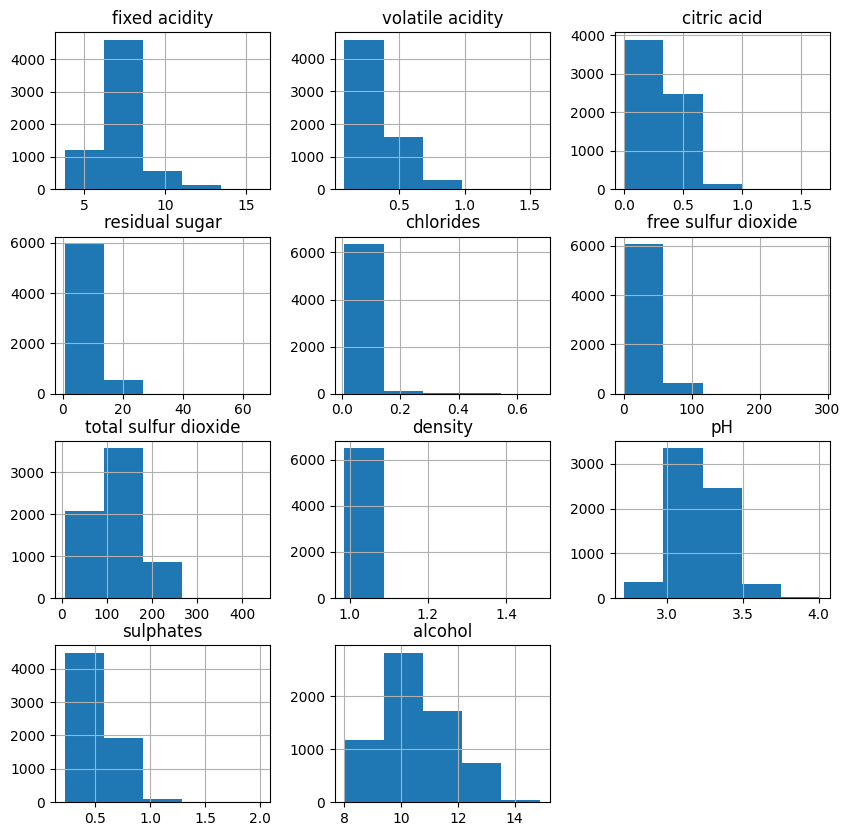

In [8]:
# Visualization of appropriate graphs corresponding with each variables.(continuous)
new_df.hist(bins=5, figsize=(10, 10))
plt.show()

### Interpretation 
> As we can see almost each variable has a negatively skewed shape, except for pH and alcohol, which are showing a nearly normal distribution.  

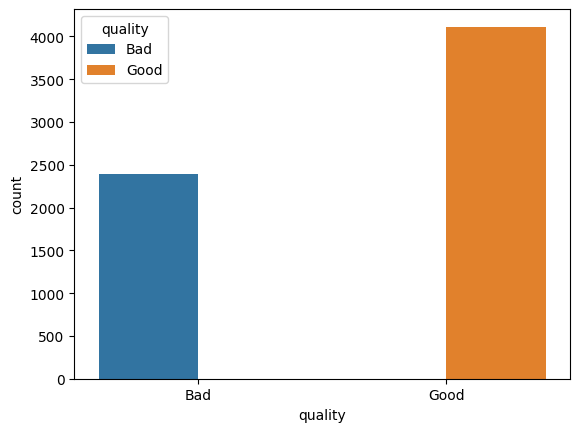

In [9]:
# Visualization of countplot as 'QUALITY' is a categorical variable 
sns.countplot(x ='quality', hue ='quality', data = new_df)
plt.show()

### Interpretation
> As quality is mapped as a categorical value, so it has a countplot. Therefore, in this diagram we can see the extent of good and bad quality, apparently number of good quality wine is higher than bad quality wine

### Handling outliers

<AxesSubplot:xlabel='residual sugar', ylabel='alcohol'>

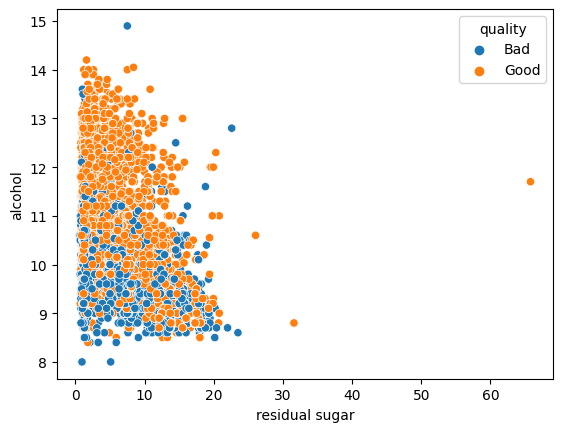

In [10]:
sns.scatterplot(data = new_df, x = 'residual sugar', y = 'alcohol',hue = "quality")

<AxesSubplot:xlabel='fixed acidity', ylabel='volatile acidity'>

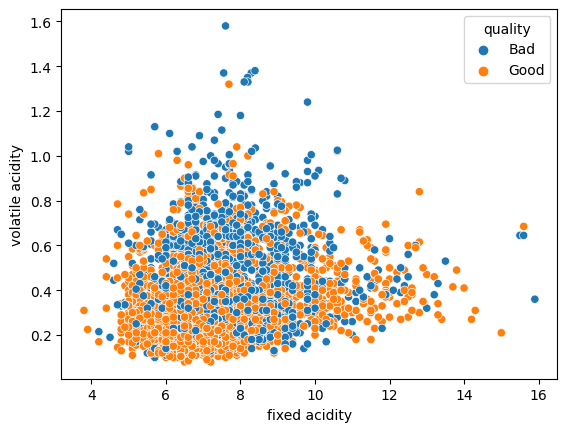

In [11]:
sns.scatterplot(data = new_df, x = 'fixed acidity', y = 'volatile acidity',hue="quality")

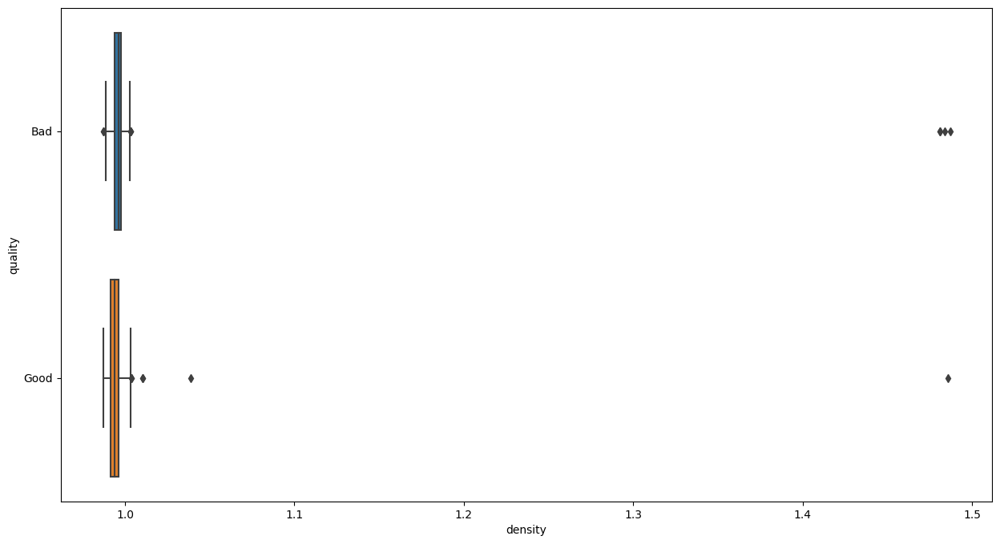

In [12]:
plt.figure(figsize=(15,8))
sns.boxplot(x = 'density', y = 'quality', data = new_df)
plt.show()

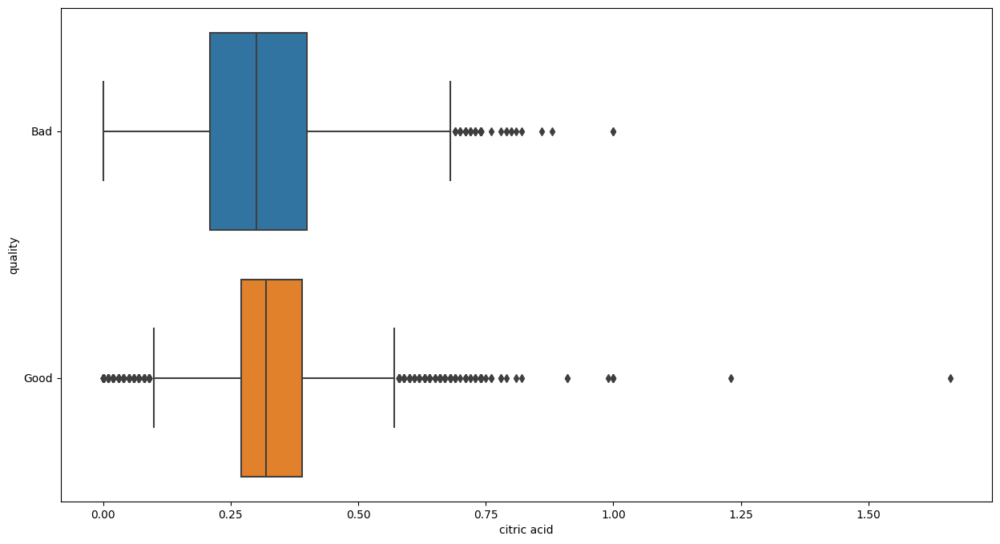

In [13]:
plt.figure(figsize=(15,8))
sns.boxplot(y = 'quality', x = 'citric acid', data = new_df)

plt.show()

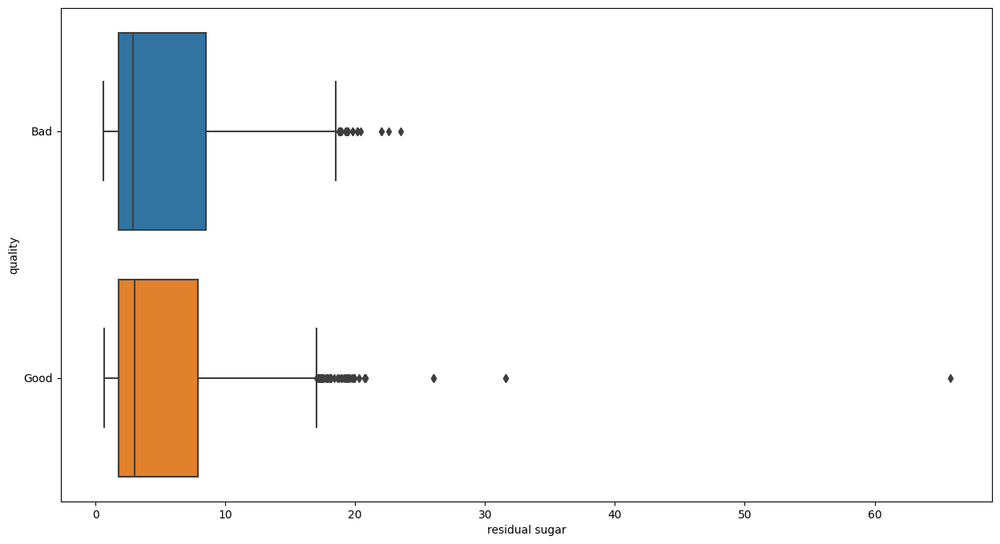

In [14]:
plt.figure(figsize=(15,8))
sns.boxplot(y = 'quality', x = 'residual sugar', data = new_df)
plt.show()

>As shown above, every column has outliers. However, I am opting not to remove/modify any outliers as I am trying to look for accuracy to minute levels, not just some approximation as **high quality wine may have very rare composition (hence outlier) from other average quality wines**.

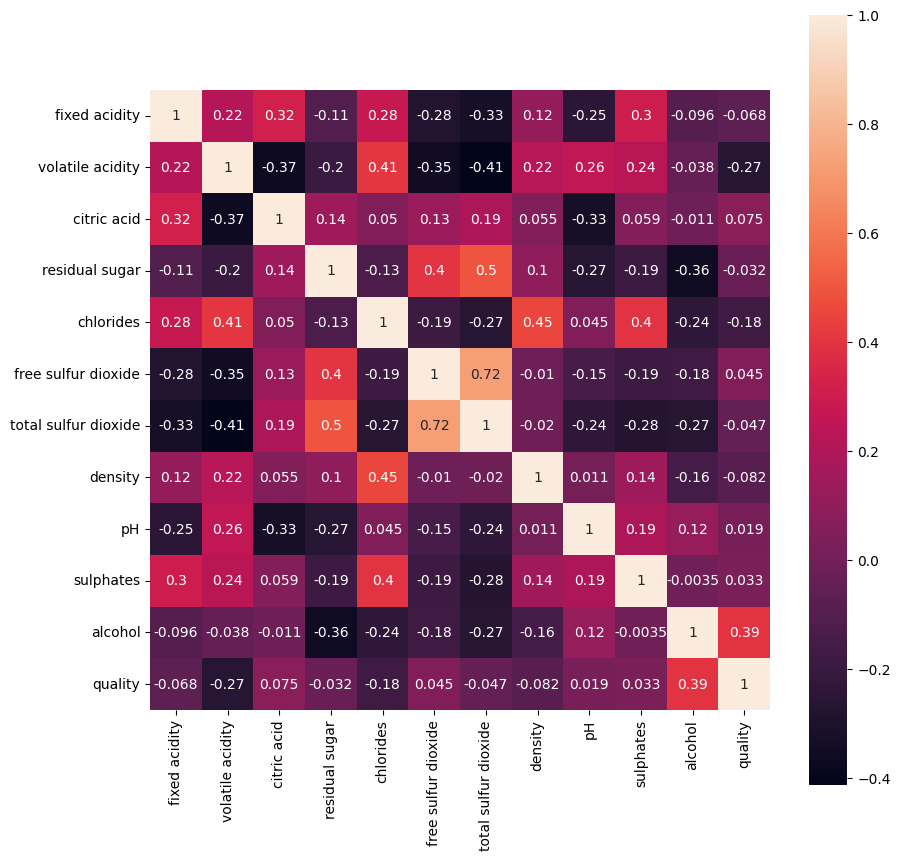

Correlation of different features of our dataset with quality:
fixed acidity : -0.0678
volatile acidity : -0.2673
citric acid : 0.0748
residual sugar : -0.0319
chlorides : -0.1762
free sulfur dioxide : 0.0451
total sulfur dioxide : -0.0468
density : -0.0823
pH : 0.0191
sulphates : 0.0334
alcohol : 0.3946
quality : 1.0000


In [15]:
# Importing a module
from scipy.stats import pearsonr

# Mapping a column
new_df['quality'] = new_df.quality.map({'Bad':1, 'Good':2})

# Ploting heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(new_df.corr(method='pearson'), annot=True, square=True)
plt.show()
 
# Heatmap summary
print('Correlation of different features of our dataset with quality:')
for i in new_df.columns:
  corr, _ = pearsonr(new_df[i], new_df['quality'])
  print('%s : %.4f' %(i,corr))

In [16]:
# Some calculations like mean, median, mode etc. 
new_df.describe().T

,count,mean,std,min,25%,50%,75%,max
fixed acidity,6502.0,7.215927,1.296162,3.80000,6.40000,7.00000,7.700,15.900
volatile acidity,6502.0,0.340449,0.166978,0.08000,0.23000,0.29000,0.400,1.580
citric acid,6502.0,0.318774,0.145351,0.00000,0.25000,0.31000,0.390,1.660
residual sugar,6502.0,5.440588,4.756935,0.60000,1.80000,3.00000,8.100,65.800
chlorides,6502.0,0.056448,0.038083,0.00900,0.03800,0.04700,0.065,0.680
free sulfur dioxide,6502.0,30.517296,17.745621,1.00000,17.00000,29.00000,41.000,289.000
total sulfur dioxide,6502.0,115.700469,56.523267,6.00000,77.00000,118.00000,156.000,440.000
density,6502.0,0.995073,0.013887,0.98711,0.99234,0.99489,0.997,1.487
pH,6502.0,3.218539,0.160774,2.72000,3.11000,3.21000,3.320,4.010
sulphates,6502.0,0.531641,0.149488,0.22000,0.43000,0.51000,0.600,2.000


In [17]:
# Construction of correlation matrix
new_df.corr()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.000000,0.218745,0.324779,-0.112288,0.280798,-0.282920,-0.329361,0.115897,-0.252507,0.299527,-0.095558,-0.067815
volatile acidity,0.218745,1.000000,-0.366397,-0.196545,0.407917,-0.350154,-0.413091,0.222791,0.258998,0.236880,-0.038290,-0.267332
citric acid,0.324779,-0.366397,1.000000,0.141634,0.049526,0.132446,0.194055,0.054891,-0.329217,0.058997,-0.010737,0.074773
residual sugar,-0.112288,-0.196545,0.141634,1.000000,-0.126391,0.403037,0.495739,0.099648,-0.267352,-0.186816,-0.359192,-0.031946
chlorides,0.280798,0.407917,0.049526,-0.126391,1.000000,-0.185783,-0.268010,0.454406,0.045152,0.397459,-0.239047,-0.176215
free sulfur dioxide,-0.282920,-0.350154,0.132446,0.403037,-0.185783,1.000000,0.721013,-0.010386,-0.145946,-0.188629,-0.179651,0.045109
total sulfur dioxide,-0.329361,-0.413091,0.194055,0.495739,-0.268010,0.721013,1.000000,-0.020487,-0.238439,-0.276566,-0.265403,-0.046826
density,0.115897,0.222791,0.054891,0.099648,0.454406,-0.010386,-0.020487,1.000000,0.010908,0.143466,-0.155183,-0.082270
pH,-0.252507,0.258998,-0.329217,-0.267352,0.045152,-0.145946,-0.238439,0.010908,1.000000,0.192243,0.121151,0.019113
sulphates,0.299527,0.236880,0.058997,-0.186816,0.397459,-0.188629,-0.276566,0.143466,0.192243,1.000000,-0.003493,0.033422


In [18]:
# Construction of covarience matrix
new_df.cov()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.680035,0.047343,0.061188,-0.692340,0.013861,-6.507489,-24.130037,0.002086,-0.052620,0.058037,-0.147676,-0.042376
volatile acidity,0.047343,0.027882,-0.008893,-0.156117,0.002594,-1.037550,-3.898809,0.000517,0.006953,0.005913,-0.007623,-0.021520
citric acid,0.061188,-0.008893,0.021127,0.097929,0.000274,0.341624,1.594301,0.000111,-0.007693,0.001282,-0.001861,0.005240
residual sugar,-0.692340,-0.156117,0.097929,22.628435,-0.022897,34.022311,133.293046,0.006583,-0.204469,-0.132846,-2.037215,-0.073262
chlorides,0.013861,0.002594,0.000274,-0.022897,0.001450,-0.125552,-0.576906,0.000240,0.000276,0.002263,-0.010854,-0.003235
free sulfur dioxide,-6.507489,-1.037550,0.341624,34.022311,-0.125552,314.907052,723.205638,-0.002559,-0.416391,-0.500389,-3.801047,0.385915
total sulfur dioxide,-24.130037,-3.898809,1.594301,133.293046,-0.576906,723.205638,3194.879658,-0.016081,-2.166814,-2.336861,-17.886111,-1.275994
density,0.002086,0.000517,0.000111,0.006583,0.000240,-0.002559,-0.016081,0.000193,0.000024,0.000298,-0.002569,-0.000551
pH,-0.052620,0.006953,-0.007693,-0.204469,0.000276,-0.416391,-2.166814,0.000024,0.025848,0.004620,0.023223,0.001481
sulphates,0.058037,0.005913,0.001282,-0.132846,0.002263,-0.500389,-2.336861,0.000298,0.004620,0.022347,-0.000623,0.002409


In [19]:
# Mapping quality column
new_df['quality'] = new_df.quality.map({1:'Bad', 2:'Good'})

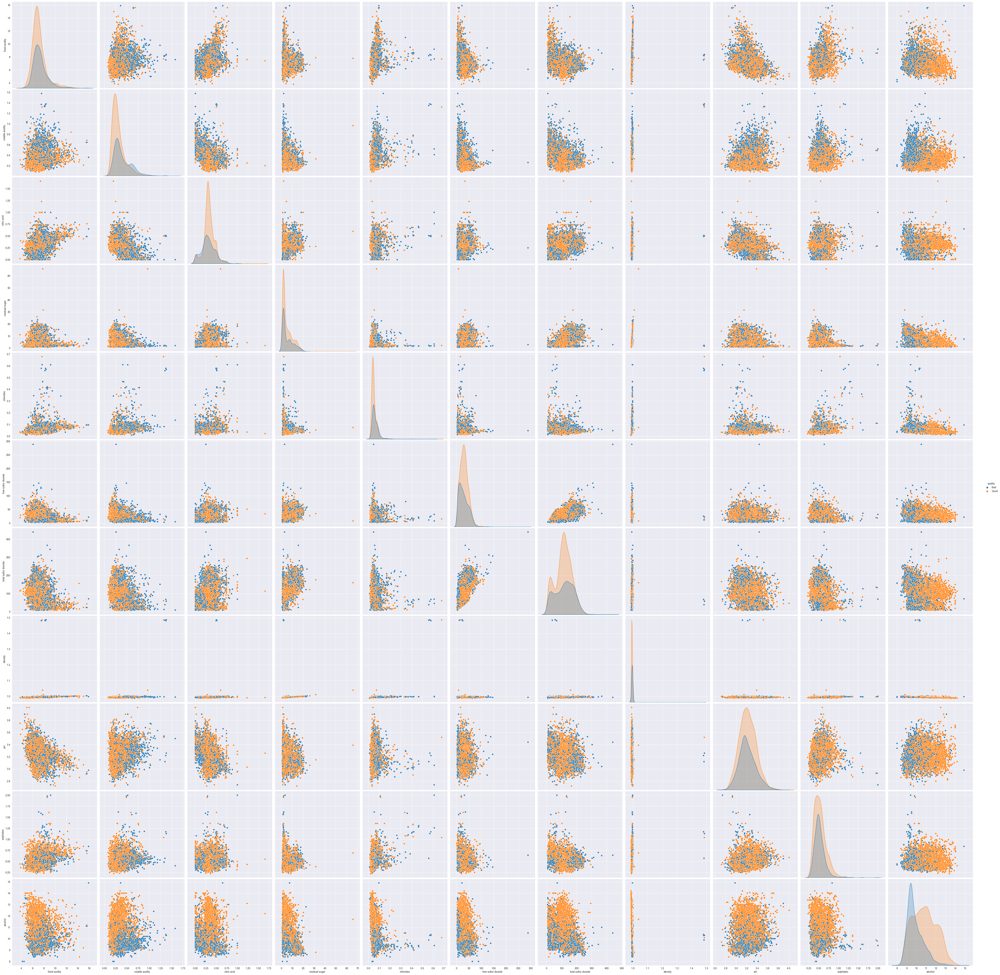

In [20]:
# Visualization of pairplots for variables
sns.set_style('darkgrid')
sns.pairplot(new_df, hue ='quality', height = 5)
plt.show()

***


In [21]:
new_df['quality'] = new_df.quality.map({'Bad':1, 'Good':2})
new_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.55,1.37,0.51,1.9,0.58,25.50,67.99,1.481,3.22,1.17,10.37,1
1,8.29,1.37,0.49,1.9,0.58,25.49,67.49,1.481,3.22,1.17,10.29,1
2,7.69,1.32,0.50,2.2,0.68,15.49,60.49,1.486,3.52,1.04,10.09,2
3,8.39,1.38,0.50,1.7,0.57,22.49,57.49,1.487,3.26,1.13,10.29,1
4,8.19,1.35,0.51,2.3,0.56,11.49,38.49,1.484,3.12,0.57,9.89,1


2    4114
1    2388
Name: quality, dtype: int64


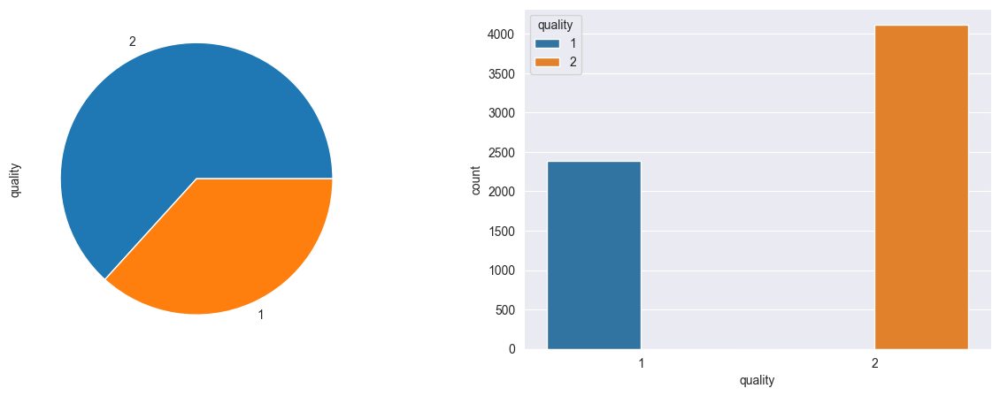

In [22]:
# Visualizing the ratio of two qualities
print(new_df['quality'].value_counts())
fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(15, 5))
ax = ax.flatten()
new_df['quality'].value_counts().plot(x=0, y=1, kind='pie', figsize=(15,5), ax=ax[0])
sns.countplot(x ='quality', hue ='quality', data = new_df, ax=ax[1])
plt.show()

In [23]:
# Mapping quality column for Linear Regression model
new_df['quality'] = new_df.quality.map({1:0, 2:1})
new_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.55,1.37,0.51,1.9,0.58,25.50,67.99,1.481,3.22,1.17,10.37,0
1,8.29,1.37,0.49,1.9,0.58,25.49,67.49,1.481,3.22,1.17,10.29,0
2,7.69,1.32,0.50,2.2,0.68,15.49,60.49,1.486,3.52,1.04,10.09,1
3,8.39,1.38,0.50,1.7,0.57,22.49,57.49,1.487,3.26,1.13,10.29,0
4,8.19,1.35,0.51,2.3,0.56,11.49,38.49,1.484,3.12,0.57,9.89,0


### Machine learning using some classifiers and evaluating the models using confusion matrix and ROC curve.

In [24]:
#Creating set of independent and dependent features
X = new_df.drop(['quality'], axis=1)
Y = new_df['quality']

from sklearn.model_selection import train_test_split as tts
 
#Creating training and test set
X_train, X_test, Y_train, Y_test = tts(X, Y, test_size=0.20, random_state=999)

In [25]:
# Importing some necessary file
import statsmodels.api as sm
import matplotlib.pyplot as plt

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn import tree
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, plot_confusion_matrix 


Optimization terminated successfully.
         Current function value: 0.519498
         Iterations 6
                            Results: Logit
Model:                Logit             Pseudo R-squared:  0.212      
Dependent Variable:   quality           AIC:               5425.8134  
Date:                 2023-04-27 12:29  BIC:               5497.9361  
No. Observations:     5201              Log-Likelihood:    -2701.9    
Df Model:             10                LL-Null:           -3429.7    
Df Residuals:         5190              LLR p-value:       1.0014e-306
Converged:            1.0000            Scale:             1.0000     
No. Iterations:       6.0000                                          
----------------------------------------------------------------------
                      Coef.  Std.Err.    z     P>|z|   [0.025   0.975]
----------------------------------------------------------------------
fixed acidity         0.0031   0.0340   0.0922 0.9266  -0.0635  0.0698
vol

e:\app\python\lib\site-packages\sklearn\linear_model\_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,
e:\app\python\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Accuracy of logistic regression model for wine data:0.74
              precision    recall  f1-score   support

           0       0.65      0.54      0.59       459
           1       0.77      0.84      0.81       842

    accuracy                           0.74      1301
   macro avg       0.71      0.69      0.70      1301
weighted avg       0.73      0.74      0.73      1301



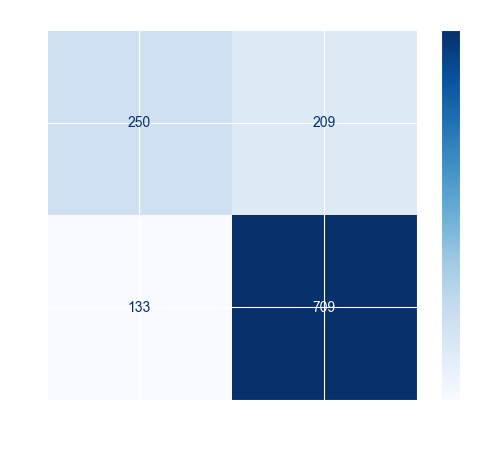

Predicted value Positive: 0.54
Predicted value Negative: 0.84
Accuracy: 0.74
Sensitivity: 0.65
Specificity: 0.77


In [26]:
# Logistic Regression Model
logit_model = sm.Logit(Y_train, X_train)
result = logit_model.fit()
print(result.summary2())

logmodel = LogisticRegression()
logmodel.fit(X_train, Y_train)
Y_pred = logmodel.predict(X_test)
print('Accuracy of logistic regression model for wine data:{:.2f}'.format(logmodel.score(X_test, Y_test)))

print(classification_report(Y_test, Y_pred))

color = 'white'
matrix = plot_confusion_matrix(logmodel, X_test, Y_test, cmap=plt.cm.Blues)
matrix.ax_.set_title('Confusion Matrix of Logistic Model', color=color)
plt.xlabel('Prediction Label', color=color)
plt.ylabel('True Label', color=color)
plt.gcf().axes[0].tick_params(colors=color)
plt.gcf().axes[1].tick_params(colors=color)
plt.show()

# Construction of Confusion Matrix
cm_dt = confusion_matrix(Y_test, Y_pred)
TP = cm_dt[0,0]
FP = cm_dt[0,1]
FN = cm_dt[1,0]
TN = cm_dt[1,1]

# Calculating Results
ppv = (TP/(TP+FP))
npv = (TN/(TN+FN))
accuracy = (TP+TN)/(TP+FP+TN+FN)
sensitivity = (TP/(TP+FN))
specificity = (TN/(TN+FP))

# Printing results
print('Predicted value Positive: {:.2f}'.format(ppv))
print('Predicted value Negative: {:.2f}'.format(npv))
print('Accuracy: {:.2f}'.format(accuracy))
print('Sensitivity: {:.2f}'.format(sensitivity))
print('Specificity: {:.2f}'.format(specificity))

              precision    recall  f1-score   support

           0       0.69      0.69      0.69       459
           1       0.83      0.83      0.83       842

    accuracy                           0.78      1301
   macro avg       0.76      0.76      0.76      1301
weighted avg       0.78      0.78      0.78      1301

[[319 140]
 [142 700]]
0.7832436587240584


e:\app\python\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


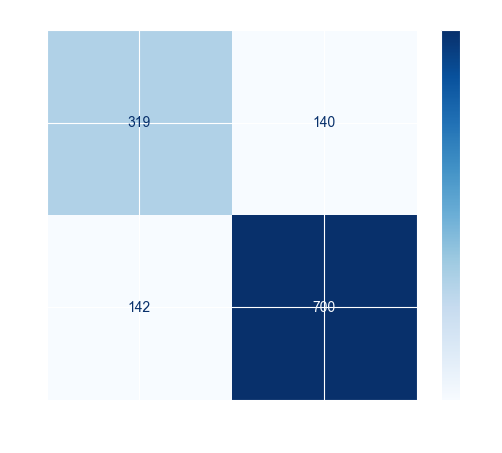

Predicted value Positive: 0.69
Predicted value Negative: 0.83
Accuracy: 0.78
Sensitivity: 0.69
Specificity: 0.83


In [27]:
# Decision Tree Model
DT = tree.DecisionTreeClassifier()

DT.fit(X_train, Y_train)
Y_pred = DT.predict(X_test)

print(classification_report(Y_test, Y_pred))
print(confusion_matrix(Y_test, Y_pred))
print(accuracy_score(Y_test, Y_pred))

color = 'white'
matrix = plot_confusion_matrix(DT, X_test, Y_test, cmap=plt.cm.Blues)
matrix.ax_.set_title('Confusion Matrix of Decision Tree', color=color)
plt.xlabel('Prediction Label', color=color)
plt.ylabel('True Label', color=color)
plt.gcf().axes[0].tick_params(colors=color)
plt.gcf().axes[1].tick_params(colors=color)
plt.show()

# Construction of Confusion Matrix
cm_dt = confusion_matrix(Y_test, Y_pred)
TP = cm_dt[0,0]
FP = cm_dt[0,1]
FN = cm_dt[1,0]
TN = cm_dt[1,1]

# Calculating Results
ppv = (TP/(TP+FP))
npv = (TN/(TN+FN))
accuracy = (TP+TN)/(TP+FP+TN+FN)
sensitivity = (TP/(TP+FN))
specificity = (TN/(TN+FP))

# Printing results
print('Predicted value Positive: {:.2f}'.format(ppv))
print('Predicted value Negative: {:.2f}'.format(npv))
print('Accuracy: {:.2f}'.format(accuracy))
print('Sensitivity: {:.2f}'.format(sensitivity))
print('Specificity: {:.2f}'.format(specificity))

              precision    recall  f1-score   support

           0       0.80      0.76      0.78       459
           1       0.87      0.90      0.89       842

    accuracy                           0.85      1301
   macro avg       0.84      0.83      0.83      1301
weighted avg       0.85      0.85      0.85      1301

[[350 109]
 [ 86 756]]
0.8501152959262106


e:\app\python\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


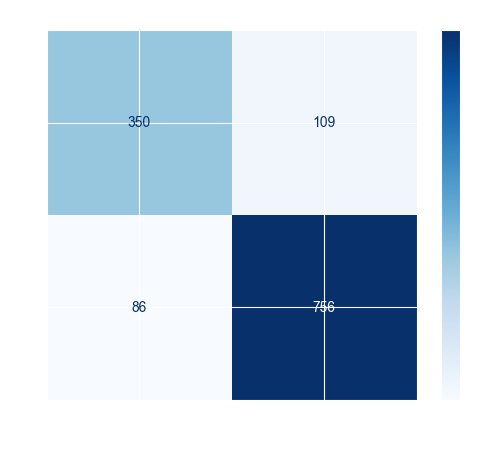

Predicted value Positive: 0.76
Predicted value Negative: 0.90
Accuracy: 0.85
Sensitivity: 0.80
Specificity: 0.87


In [28]:
# Random Forest classifier
RF = RandomForestClassifier(n_estimators=101)

RF.fit(X_train, Y_train)
Y_pred = RF.predict(X_test)

print(classification_report(Y_test, Y_pred))
print(confusion_matrix(Y_test, Y_pred))
print(accuracy_score(Y_test, Y_pred))


color = 'white'
matrix = plot_confusion_matrix(RF, X_test, Y_test, cmap=plt.cm.Blues)
matrix.ax_.set_title('Confusion Matrix of Decision Tree', color=color)
plt.xlabel('Prediction Label', color=color)
plt.ylabel('True Label', color=color)
plt.gcf().axes[0].tick_params(colors=color)
plt.gcf().axes[1].tick_params(colors=color)
plt.show()

# Construction of Confusion Matrix
cm_dt = confusion_matrix(Y_test, Y_pred)
TP = cm_dt[0,0]
FP = cm_dt[0,1]
FN = cm_dt[1,0]
TN = cm_dt[1,1]

# Calculating Results
ppv = (TP/(TP+FP))
npv = (TN/(TN+FN))
accuracy = (TP+TN)/(TP+FP+TN+FN)
sensitivity = (TP/(TP+FN))
specificity = (TN/(TN+FP))

# Printing results
print('Predicted value Positive: {:.2f}'.format(ppv))
print('Predicted value Negative: {:.2f}'.format(npv))
print('Accuracy: {:.2f}'.format(accuracy))
print('Sensitivity: {:.2f}'.format(sensitivity))
print('Specificity: {:.2f}'.format(specificity))

              precision    recall  f1-score   support

           0       0.40      0.01      0.02       459
           1       0.65      0.99      0.78       842

    accuracy                           0.65      1301
   macro avg       0.52      0.50      0.40      1301
weighted avg       0.56      0.65      0.51      1301

[[  4 455]
 [  6 836]]
0.6456571867794004


e:\app\python\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


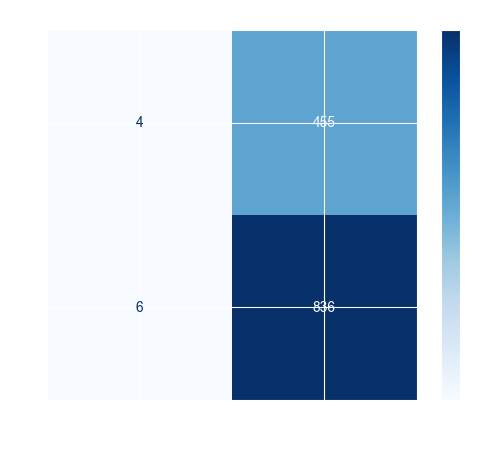

Predicted value Positive: 0.01
Predicted value Negative: 0.99
Accuracy: 0.65
Sensitivity: 0.40
Specificity: 0.65


In [29]:
# Support Vector Machines classifier
SV = SVC(kernel='poly', degree = 3)

SV.fit(X_train, Y_train)
Y_pred = SV.predict(X_test)

print(classification_report(Y_test, Y_pred))
print(confusion_matrix(Y_test, Y_pred))
print(accuracy_score(Y_test, Y_pred))

color = 'white'
matrix = plot_confusion_matrix(SV, X_test, Y_test, cmap=plt.cm.Blues)
matrix.ax_.set_title('Confusion Matrix of Decision Tree', color=color)
plt.xlabel('Prediction Label', color=color)
plt.ylabel('True Label', color=color)
plt.gcf().axes[0].tick_params(colors=color)
plt.gcf().axes[1].tick_params(colors=color)
plt.show()

# Construction of Confusion Matrix
cm_dt = confusion_matrix(Y_test, Y_pred)
TP = cm_dt[0,0]
FP = cm_dt[0,1]
FN = cm_dt[1,0]
TN = cm_dt[1,1]

# Calculating Results
ppv = (TP/(TP+FP))
npv = (TN/(TN+FN))
accuracy = (TP+TN)/(TP+FP+TN+FN)
sensitivity = (TP/(TP+FN))
specificity = (TN/(TN+FP))

# Printing results
print('Predicted value Positive: {:.2f}'.format(ppv))
print('Predicted value Negative: {:.2f}'.format(npv))
print('Accuracy: {:.2f}'.format(accuracy))
print('Sensitivity: {:.2f}'.format(sensitivity))
print('Specificity: {:.2f}'.format(specificity))

### ROC curve for comparison

DT AUC: 0.7631715129968588
RF AUC2: 0.9131800516458893
SVM AUC3: 0.7068914660084145
LR AUC4: 0.7959444004574645


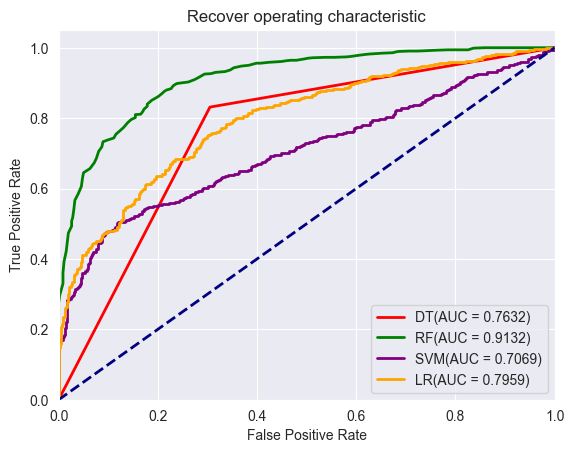

In [30]:
# Calculating probability prediction for Random Forest
probRF = RF.predict_proba(X_test)
probRF = probRF[:, 1]

# Calculating probability prediction for Decision Tree
probDT = DT.predict_proba(X_test)
probDT = probDT[:, 1]

# Calculating probability prediction for Support Vector Machines
probSV = SV.fit(X_train, Y_train).decision_function(X_test)

# Calculating probability prediction for Logistic Regression
probLR = logmodel.predict_proba(X_test)
probLR = probLR[:, 1]

# Importing ROC and AUC
from sklearn.metrics import roc_curve, roc_auc_score

# Calculating AUC score
auc = roc_auc_score(Y_test, probDT)
auc2 = roc_auc_score(Y_test, probRF)
auc3 = roc_auc_score(Y_test, probSV)
auc4 = roc_auc_score(Y_test, probLR)

# Printing AUC score
print('DT AUC:', auc)
print('RF AUC2:', auc2)
print('SVM AUC3:', auc3)
print('LR AUC4:', auc4)

# Assigning probabilities for ploting
fpr, tpr, thresholds = roc_curve(Y_test, probDT)
fpr2, tpr2, thresholds2 = roc_curve(Y_test, probRF)
fpr3, tpr3, thresholds3 = roc_curve(Y_test, probSV)
fpr4, tpr4, thresholds4 = roc_curve(Y_test, probLR)

# Ploting the results
plt.figure()
lw = 2
plt.plot(fpr, tpr, color='red',lw=lw, label='DT(AUC = %0.4f)' % auc)
plt.plot(fpr2, tpr2, color='green',lw=lw, label='RF(AUC = %0.4f)' % auc2)
plt.plot(fpr3, tpr3, color='purple',lw=lw, label='SVM(AUC = %0.4f)' % auc3)
plt.plot(fpr4, tpr4, color='orange',lw=lw, label='LR(AUC = %0.4f)' % auc4)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Recover operating characteristic')
plt.legend(loc="lower right")
plt.show()

### Model Evaluation:
> ROC: A receiver operating characteristic curve, or ROC curve, is a graphical plot that illustrates the diagnostic ability of a binary classifier system as its discrimination threshold is varied. 

> The ROC curve is created by plotting the true positive rate (TPR) against the false positive rate (FPR) at various threshold settings. The true-positive rate is also known as sensitivity, recall or probability of detection.The false-positive rate is also known as probability of false alarm and can be calculated as (1 − specificity).

> **Now from the above ROC curve for wine Data, We can clearly see Random Forest classifier has possession over the largest area under the curve. Therefore, by definition Random Forest is the best classifier amongst the other classifier in this study, i.e. Decision Tree, Logistic Regression and Support Vector Machines.**

> **Hence, the best model for perdicting wine quality in this study is Random Forest classifier.**

### Best model interpretation with whole data.

              precision    recall  f1-score   support

           0       0.72      0.51      0.60      2388
           1       0.76      0.89      0.82      4114

    accuracy                           0.75      6502
   macro avg       0.74      0.70      0.71      6502
weighted avg       0.75      0.75      0.74      6502

[[1227 1161]
 [ 471 3643]]
0.7490003075976622


e:\app\python\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.


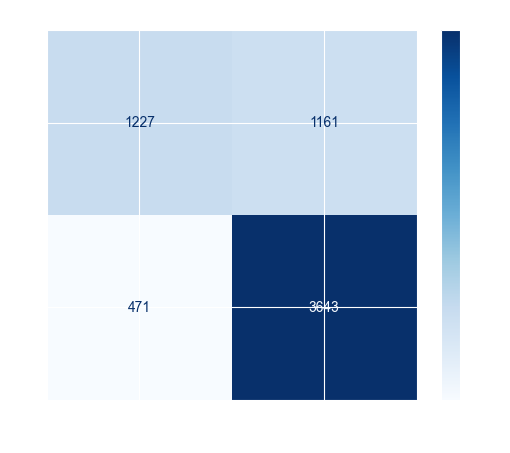

Predicted value Positive: 0.51
Predicted value Negative: 0.89
Accuracy: 0.75
Sensitivity: 0.72
Specificity: 0.76


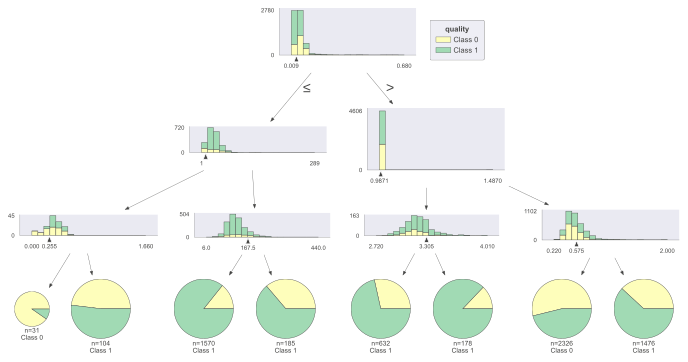

In [33]:
# Random Forest classifier
from sklearn.ensemble import RandomForestClassifier
import dtreeviz

RF = RandomForestClassifier(n_estimators=101, max_depth=3,
                            max_features='auto',
                            min_samples_leaf=4,
                            bootstrap=True,
                            n_jobs=-1,
                            random_state=0)

RF.fit(X, Y)

Y_pred = RF.predict(X)

print(classification_report(Y, Y_pred))
print(confusion_matrix(Y, Y_pred))
print(accuracy_score(Y, Y_pred))


color = 'white'
matrix = plot_confusion_matrix(RF, X, Y, cmap=plt.cm.Blues)
matrix.ax_.set_title('Confusion Matrix of Decision Tree', color=color)
plt.xlabel('Prediction Label', color=color)
plt.ylabel('True Label', color=color)
plt.gcf().axes[0].tick_params(colors=color)
plt.gcf().axes[1].tick_params(colors=color)
plt.show()

# Construction of Confusion Matrix
cm_dt = confusion_matrix(Y, Y_pred)
TP = cm_dt[0,0]
FP = cm_dt[0,1]
FN = cm_dt[1,0]
TN = cm_dt[1,1]

# Calculating Results
ppv = (TP/(TP+FP))
npv = (TN/(TN+FN))
accuracy = (TP+TN)/(TP+FP+TN+FN)
sensitivity = (TP/(TP+FN))
specificity = (TN/(TN+FP))

# Printing results
print('Predicted value Positive: {:.2f}'.format(ppv))
print('Predicted value Negative: {:.2f}'.format(npv))
print('Accuracy: {:.2f}'.format(accuracy))
print('Sensitivity: {:.2f}'.format(sensitivity))
print('Specificity: {:.2f}'.format(specificity))

viz = dtreeviz.model(RF.estimators_[100], X, Y,
               target_name="quality",
#                class_names=list(new_df.target_names),
#                title="100th decision tree - Wine data"
                    )
viz.view()

> As it is shown above **Random Forest Classifier** is by far the best model for classifying wine quality, even for the whole datasets.